In [68]:
import numpy as numpy #librería de algebra lineal
import pandas as panda #librería para el procesamiento de datos
#librería para crear gráficas
import plotly.express as plotly #sofisticadas 
import matplotlib.pyplot as matplot #sencillas
import re #librería para hacer uso de expresiones regulares

import os #se importan los datasets con los que se trabajaran
for dirname, _, filenames in os.walk('C:/Users/Valeria/Documents/9no Semestre/Analítica de Big Data/Proyecto Final/Breastfeeding/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

C:/Users/Valeria/Documents/9no Semestre/Analítica de Big Data/Proyecto Final/Breastfeeding/Breastfeeding_3months.xlsx
C:/Users/Valeria/Documents/9no Semestre/Analítica de Big Data/Proyecto Final/Breastfeeding/Breastfeeding_3months_.csv
C:/Users/Valeria/Documents/9no Semestre/Analítica de Big Data/Proyecto Final/Breastfeeding/FormulaMilk_3months.xlsx
C:/Users/Valeria/Documents/9no Semestre/Analítica de Big Data/Proyecto Final/Breastfeeding/FormulaMilk_3months_.csv


In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
#Se realiza la lectura del archivo que se analizará
dataset = panda.read_csv('C:/Users/Valeria/Documents/9no Semestre/Analítica de Big Data/Proyecto Final/Breastfeeding/Breastfeeding_3months_.csv')

In [5]:
dataset.head() #Se muestra una parte de la información

,status_id,created_at,text,display_text_width,country,day
0,1538941385809747968,2022-06-20 17:46:33 UTC,Manic Mondays ☕\n\nFrom the 16th century onwar...,140,NaN,Monday
1,1538941854649032705,2022-06-20 17:48:24 UTC,southern softie commented on MailOnline: What ...,196,NaN,Monday
2,1538942219645861892,2022-06-20 17:49:51 UTC,MomToBe Women’s Rayon Maternity Dress/Easy Bre...,163,NaN,Monday
3,1538942452723335169,2022-06-20 17:50:47 UTC,@AlfredMwandagha Good for a breastfeeding bunn...,33,NaN,Monday
4,1538942645011030016,2022-06-20 17:51:33 UTC,We know more about cow’s milk than human milk....,140,NaN,Monday


In [6]:
dataset.info() #Devuelve la información de las columnas

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 238045 entries, 0 to 238044
Data columns (total 6 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   status_id           238045 non-null  int64 
 1   created_at          238045 non-null  object
 2   text                228058 non-null  object
 3   display_text_width  238045 non-null  int64 
 4   country             485 non-null     object
 5   day                 238045 non-null  object
dtypes: int64(2), object(4)
memory usage: 10.9+ MB


In [7]:
dataset.isna().sum() #Busca las columnas que tengan valores nulos

status_id                  0
created_at                 0
text                    9987
display_text_width         0
country               237560
day                        0
dtype: int64

In [8]:
#Devuelve el tipo de objeto en la columna 'created_at'
type(dataset.at[0, 'created_at'])
#El valor que devuelve es str

str

In [9]:
dataset['created_at'] = panda.to_datetime(dataset['created_at']) #Cambia de string datetime a datetime

In [10]:
dataset['created_at'].head() #Muestra las primeras fechas en formato string datetime

0   2022-06-20 17:46:33+00:00
1   2022-06-20 17:48:24+00:00
2   2022-06-20 17:49:51+00:00
3   2022-06-20 17:50:47+00:00
4   2022-06-20 17:51:33+00:00
Name: created_at, dtype: datetime64[ns, UTC]

In [11]:
dataset['country'].unique()

array([nan, 'United States', 'United Kingdom',
       'Republic of the Philippines', 'South Africa', 'Zimbabwe', 'India',
       'Rwanda', 'Canada', 'Ireland', 'Australia', 'Kenya', 'Vietnam',
       'Malaysia', 'East Timor', 'Denmark', 'Indonesia', 'Nigeria',
       'The Netherlands', 'Italy', 'Pakistan', 'Germany', 'Jamaica',
       'Switzerland', 'Norway', 'Singapore', 'Spain', 'Mexico',
       'Kingdom of Saudi Arabia', 'Ghana', 'Uganda', 'Thailand', 'Cyprus',
       'Trinidad and Tobago', 'Botswana', 'Portugal', 'Namibia',
       'New Zealand', 'Republic of Slovenia', 'Ethiopia',
       'United Arab Emirates', 'Latvia', 'Maldives', 'Zambia',
       'Dominican Republic', "People's Republic of China"], dtype=object)

In [12]:
#pip install pycountry #Instalación de pycountry

In [13]:
import pycountry
mapeo = {country.name: country.alpha_3 for country in pycountry.countries} #alpha_3 cambia el nombre del país por sus 3 siglas
mapeo_banderas = {country.name: country.flag for country in pycountry.countries} #Obtiene las banderas de los países

In [14]:
#Se renombran los nombres de los países a los cuales no se pueden obtener su código
dataset['country'].replace(['Republic of the Philippines', 'Vietnam', 'East Timor','The Netherlands', 
'Kingdom of Saudi Arabia', 'Republic of Slovenia', "People's Republic of China"], 
['Philippines', 'Viet Nam', 'Timor-Leste', 'Netherlands', 'Saudi Arabia', 'Slovenia', 'China'],regex = True, inplace = True)
#regex permite expresiones regulates e inplace permite aplicar los cambios directamente al dataset

In [15]:
dataset = dataset.assign(country_code = None) #Se agrega la columna country_code
dataset = dataset.assign(country_flag = None) #Se agrega la columna country_flag
for index in dataset.index:   #Realiza recorrido por filas del dataset
    country = dataset.at[index, 'country']  #country es igual al elemento en index de la columna country
    dataset.at[index, 'country_code'] = mapeo.get(country) #Se coloca en el dataset las siglas del país
    dataset.at[index, 'country_flag'] = mapeo_banderas.get(country) #Se coloca en el dataset las banderas

In [16]:
dataset['country_code'].unique() #Obtiene de la columna country_code los elementos no repetidos, siendo 45 países

array([None, 'USA', 'GBR', 'PHL', 'ZAF', 'ZWE', 'IND', 'RWA', 'CAN',
       'IRL', 'AUS', 'KEN', 'VNM', 'MYS', 'TLS', 'DNK', 'IDN', 'NGA',
       'NLD', 'ITA', 'PAK', 'DEU', 'JAM', 'CHE', 'NOR', 'SGP', 'ESP',
       'MEX', 'SAU', 'GHA', 'UGA', 'THA', 'CYP', 'TTO', 'BWA', 'PRT',
       'NAM', 'NZL', 'SVN', 'ETH', 'ARE', 'LVA', 'MDV', 'ZMB', 'DOM',
       'CHN'], dtype=object)

In [17]:
dataset['country_flag'].unique() #Obtiene de la columna country_code los elementos no repetidos, siendo 45 países

array([None, '🇺🇸', '🇬🇧', '🇵🇭', '🇿🇦', '🇿🇼', '🇮🇳', '🇷🇼', '🇨🇦', '🇮🇪', '🇦🇺',
       '🇰🇪', '🇻🇳', '🇲🇾', '🇹🇱', '🇩🇰', '🇮🇩', '🇳🇬', '🇳🇱', '🇮🇹', '🇵🇰', '🇩🇪',
       '🇯🇲', '🇨🇭', '🇳🇴', '🇸🇬', '🇪🇸', '🇲🇽', '🇸🇦', '🇬🇭', '🇺🇬', '🇹🇭', '🇨🇾',
       '🇹🇹', '🇧🇼', '🇵🇹', '🇳🇦', '🇳🇿', '🇸🇮', '🇪🇹', '🇦🇪', '🇱🇻', '🇲🇻', '🇿🇲',
       '🇩🇴', '🇨🇳'], dtype=object)

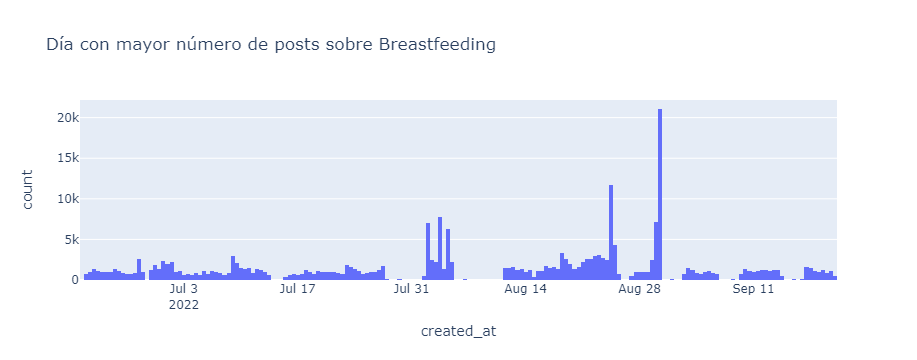

In [93]:
figura = plotly.histogram(dataset, x = 'created_at', title='Día con mayor número de posts sobre Breastfeeding')
figura.show()

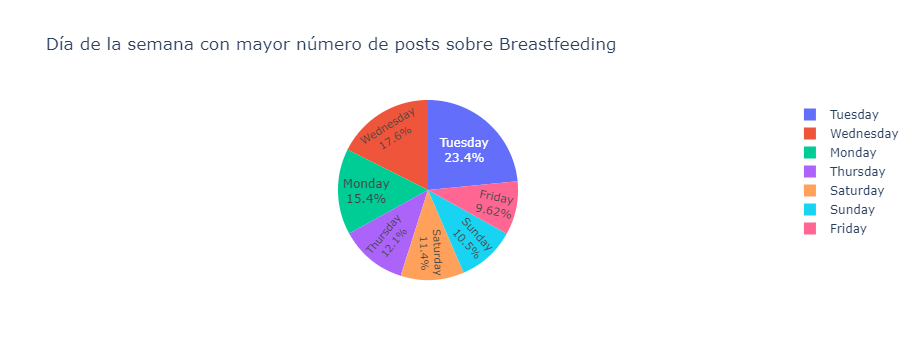

In [92]:
pie = dataset.groupby(['day']).size().reset_index(name = 'size')
pie.sort_values(by='size', ascending=False ,inplace=True)
figura = plotly.pie(pie, values='size', names='day',
             title='Día de la semana con mayor número de posts sobre Breastfeeding',
             hover_data=['size'])
figura.update_traces(textposition='inside', textinfo='percent+label')
figura.show()

In [97]:
pie = dataset.groupby(['day']).size().reset_index(name = 'size')
print(pie)
pie.sort_values(by='size', ascending=False, inplace=True)
print('----------------')
print(pie)

         day   size
0     Friday  22901
1     Monday  36767
2   Saturday  27116
3     Sunday  24878
4   Thursday  28709
5    Tuesday  55812
6  Wednesday  41862
------------------------
         day   size
5    Tuesday  55812
6  Wednesday  41862
1     Monday  36767
4   Thursday  28709
2   Saturday  27116
3     Sunday  24878
0     Friday  22901


In [85]:
dtMundial = dataset.groupby(['country', 'country_code', 'country_flag']).size().reset_index(name = 'size')
dtMundial.sort_values(by='size', ascending=False ,inplace=True)

In [86]:
dtMundial.head()

,country,country_code,country_flag,size
41,United States,USA,🇺🇸,213
40,United Kingdom,GBR,🇬🇧,81
15,Kenya,KEN,🇰🇪,23
32,South Africa,ZAF,🇿🇦,18
10,India,IND,🇮🇳,17


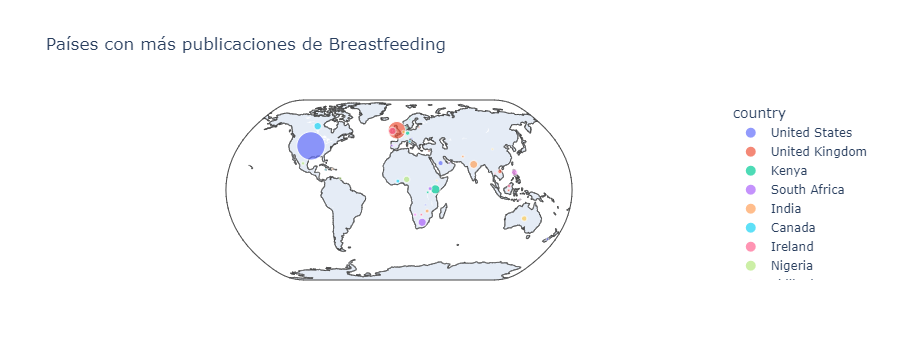

In [87]:
figura = plotly.scatter_geo(dtMundial, locations="country_code", color="country",
                     hover_name="country", size="size",
                     projection="natural earth1",title="Países con más publicaciones de Breastfeeding")
figura.show()

In [23]:
dataset['date'] = panda.to_datetime(dataset['created_at']).dt.date
dataset['hour'] = panda.to_datetime(dataset['created_at']).dt.time

In [24]:
dataset.head()

,status_id,created_at,text,display_text_width,country,day,country_code,country_flag,date,hour
0,1538941385809747968,2022-06-20 17:46:33+00:00,Manic Mondays ☕\n\nFrom the 16th century onwar...,140,NaN,Monday,None,None,2022-06-20,17:46:33
1,1538941854649032705,2022-06-20 17:48:24+00:00,southern softie commented on MailOnline: What ...,196,NaN,Monday,None,None,2022-06-20,17:48:24
2,1538942219645861892,2022-06-20 17:49:51+00:00,MomToBe Women’s Rayon Maternity Dress/Easy Bre...,163,NaN,Monday,None,None,2022-06-20,17:49:51
3,1538942452723335169,2022-06-20 17:50:47+00:00,@AlfredMwandagha Good for a breastfeeding bunn...,33,NaN,Monday,None,None,2022-06-20,17:50:47
4,1538942645011030016,2022-06-20 17:51:33+00:00,We know more about cow’s milk than human milk....,140,NaN,Monday,None,None,2022-06-20,17:51:33


In [25]:
promedio = dataset['created_at'].mean()
print(promedio)

2022-08-08 11:03:51.010762240+00:00


In [ ]:
dt=dataset.groupby([dataset['created_at'].dt.hour])['status_id'].count()
print(dt)

created_at
0      7102
1      7259
2      7226
3      7000
4      7095
5      7431
6      8300
7      9714
8      9202
9      9171
10     9375
11    11064
12    12398
13    13030
14    13734
15    14172
16    13775
17    12183
18    11280
19    10814
20    10256
21     9263
22     8817
23     8384
Name: status_id, dtype: int64


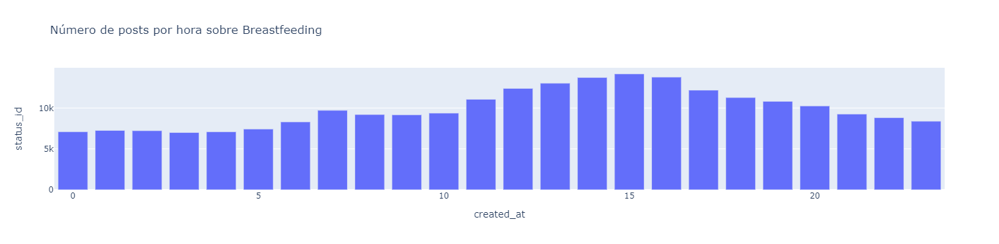

In [101]:
figura = plotly.bar(dt, y='status_id', title="Número de posts por hora sobre Breastfeeding")
figura.show()